### Implement Edge Detection

Write a Python function using OpenCV that takes an image file path as input, applies Canny edge detection on the image, and displays the original and edge-detected images side by side.

In [ ]:
#importing the necessary libraries
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
from google.colab.patches import cv2_imshow
#so that imshow function can be used

In [ ]:
#the function to convert an image to canny and display both of them
def bgr_to_canny(path):
  image=cv.imread(path)
  gray=cv.cvtColor(image,cv.COLOR_BGR2GRAY)
  canny=cv.Canny(gray,125,175)
  canny=cv.cvtColor(canny,cv.COLOR_GRAY2BGR)
  hor_cat=np.concatenate((image,canny),axis=1)
  cv2_imshow(hor_cat)
  cv.waitKey(0)
  cv.destroyAllWindows()

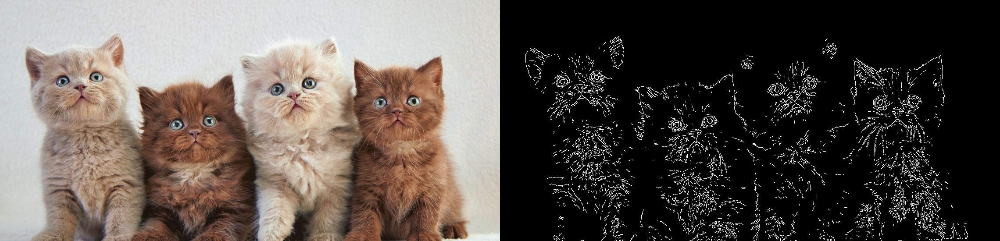

In [ ]:
#using the function
path='/content/kittens1.jpg'
bgr_to_canny(path)

### Face and Eye Detection

Create a function that detects faces and eyes in a given image using Haar cascades in OpenCV. The function should draw rectangles around detected faces and eyes and display the output image.

In [ ]:
#obtaining the haar cascade models for face and eye recognition
face_cascade = cv.CascadeClassifier(cv.data.haarcascades + 'haarcascade_frontalface_default.xml')
eye_cascade = cv.CascadeClassifier(cv.data.haarcascades + 'haarcascade_eye.xml')

#the function that detects faces and eyes and draws rectangles around the detected ones
def fae(img):
  gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
  faces = face_cascade.detectMultiScale(gray, 1.1, 4)
  # draws blue rectangles around detected faces and green ones around the detected eyes
  for (x, y, w, h) in faces:
     cv.rectangle(img, (x, y), (x + w, y + h), (255, 0, 0), 2)
     # creating smaller images for faces ( eyes will lie within the face rectangles)
     roi_gray = gray[y:y + h, x:x + w]
     roi_color = img[y:y + h, x:x + w]
     eyes = eye_cascade.detectMultiScale(roi_gray,1.3,5)
     for (ex, ey, ew, eh) in eyes:
      cv.rectangle(roi_color, (ex, ey), (ex + ew, ey + eh), (0, 255, 0), 2)  # Green for eyes

  cv2_imshow(img)
  cv.waitKey(0)
  cv.destroyAllWindows()

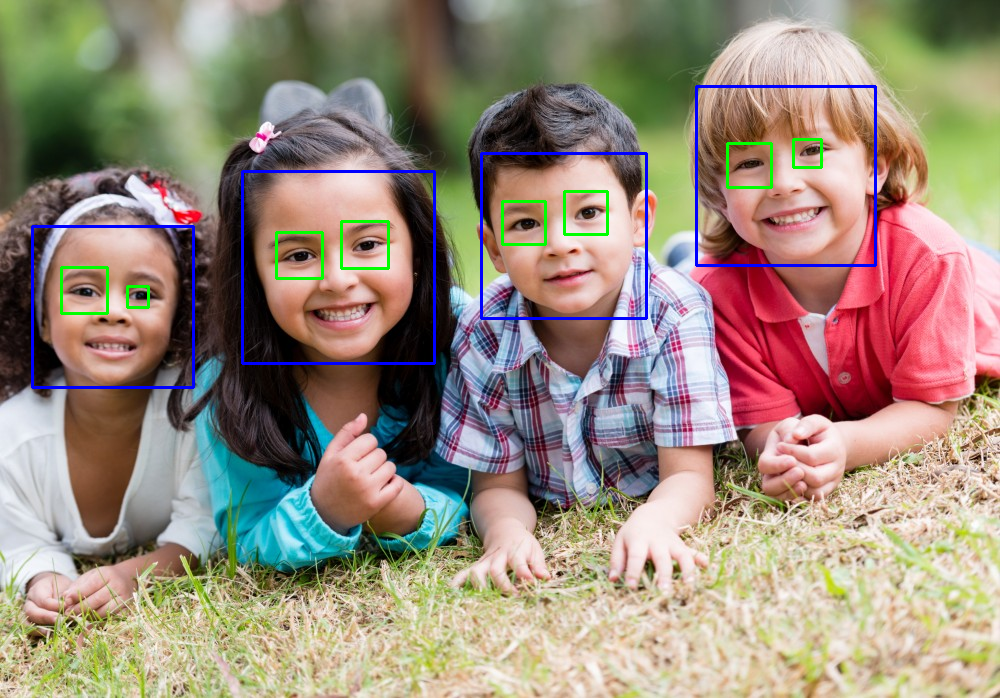

In [ ]:
# using the function
image=cv.imread('/content/kids.jpg')
fae(image)

###Image Cropping Based on Facial Features

Write a function that takes an image path as input and detects faces. If exactly one face is detected, return the cropped image of the face. Use Haar cascades for face detection.

In [ ]:
# obtaining the face detection function from haarcascade model
face_cascade = cv.CascadeClassifier(cv.data.haarcascades + 'haarcascade_frontalface_default.xml')

# the function to detect and crop out the face if only one is detected
def Face(path):
  img=cv.imread(path)
  gray=cv.cvtColor(img,cv.COLOR_BGR2GRAY)
  faces=face_cascade.detectMultiScale(gray,1.4,6)
  print(len(faces))
  if(len(faces)==1):
    x,y,w,h=faces[0]
    cv.imwrite('cropped_face.jpg',img[y:y+h,x:x+h])
    return img[y:y+h,x:x+h]
  elif len(faces)>1:
    print("Multiple Faces Detected")
  else:
    print("No Faces Detected")

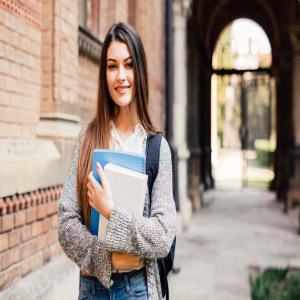

1


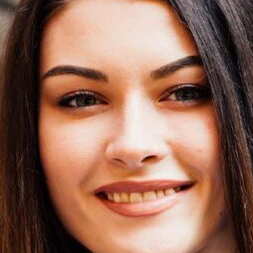

In [ ]:
path='/content/student.jpg'
image=cv.imread(path)
image=cv.resize(image,(300,300),interpolation=cv.INTER_AREA)
cv2_imshow(image)
face=Face(path)
if face is not None:
  cv2_imshow(face)

cv.waitKey(0)
cv.destroyAllWindows()

### Feature Matching with ORB
Create a Python script that uses ORB to detect and match features between two images. The script should display the matched keypoints on the output image.

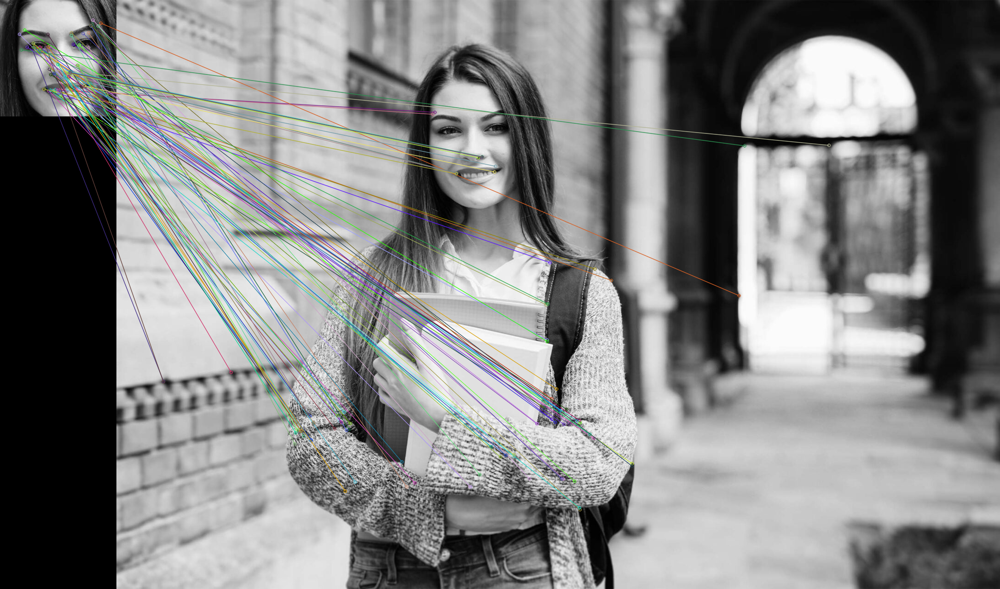

In [ ]:
img1=cv.imread('/content/cropped_face.jpg')
img2=cv.imread('/content/student.jpg')
gray1=cv.cvtColor(img1,cv.COLOR_BGR2GRAY)
gray2=cv.cvtColor(img2,cv.COLOR_BGR2GRAY)
orb = cv.ORB_create()
kp1, des1 = orb.detectAndCompute(gray1,None)
kp2, des2 = orb.detectAndCompute(gray2,None)
bf = cv.BFMatcher(cv.NORM_HAMMING, crossCheck=True)
matches = bf.match(des1,des2)

img3 = cv.drawMatches(gray1,kp1,gray2,kp2,matches[:],None,flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
cv2_imshow(img3)
cv.waitKey(0)
cv.destroyAllWindows()

### Applying Gaussian Blur for Noise Reduction
Write a function that applies a Gaussian blur to an image to reduce noise and displays both the original and blurred images.

In [ ]:
def gaussianblur(image):
  image=cv.resize(image,(300,300),interpolation=cv.INTER_AREA)
  gblur=cv.GaussianBlur(image,(7,7),cv.BORDER_DEFAULT)
  cat=np.concatenate((image,gblur),axis=1)
  cv2_imshow(cat)
cv.waitKey(0)
cv.destroyAllWindows()

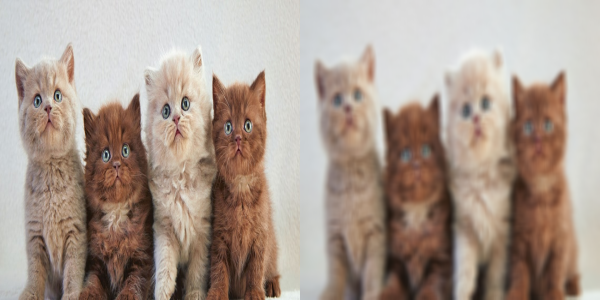

In [ ]:
image=cv.imread('/content/kittens1.jpg')
gaussianblur(image)

### Pyramid Transform for Image Scaling
Create a function that creates a pyramid of images (both up and down) for a given image and displays the results.

In [ ]:
def pyramid(image,n):
  layer=[image]
  img=image.copy()
  for i in range(n):
    img=cv.pyrUp(img)
    layer.append(img)
    cv2_imshow(layer[i+1])
    cv.waitKey(0)
  img=image.copy()
  for i in range(n):
    img=cv.pyrDown(img)
    layer.append(img)
    cv2_imshow(layer[i+4])
    cv.waitKey(0)

  cv.destroyAllWindows()

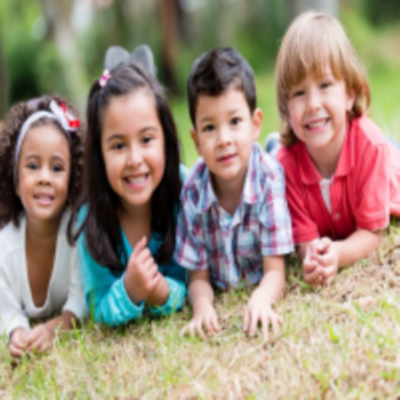

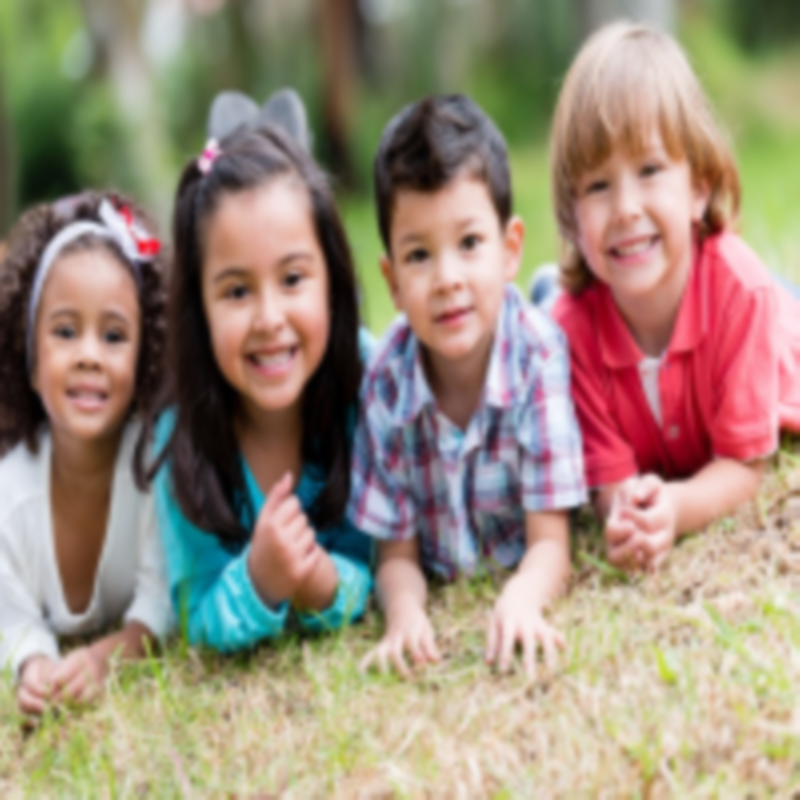

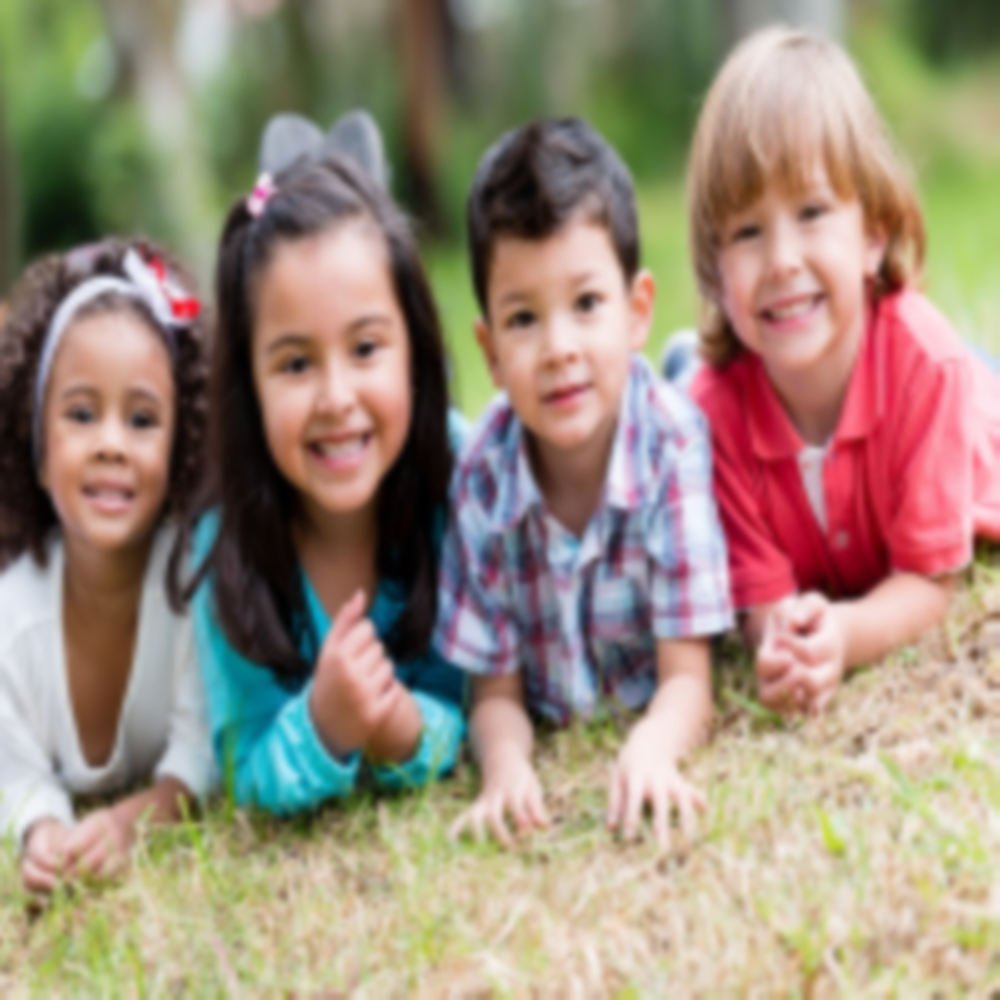

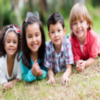

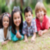

In [ ]:
image=cv.imread('/content/kids.jpg')
image=cv.resize(image,(200,200),interpolation=cv.INTER_AREA)
pyramid(image,3)

### Implement Harris Corner Detection in Python
Write a Python function using OpenCV that takes an image file as input and applies the Harris Corner Detection algorithm. Your function should display the original image with the detected corners marked. Include parameters to specify the block size, ksize, and free parameter for flexibility.

In [ ]:
def harris(image):
  gray=cv.cvtColor(image, cv.COLOR_BGR2GRAY)
  gray=np.float32(gray)

  dst = cv.cornerHarris(gray, blockSize=2, ksize=3, k=0.04)

  dst = cv.dilate(dst, None)
  image[dst > 0.01 * dst.max()] = [0, 0, 255]

  cv2_imshow(image)
  cv.waitKey(0)

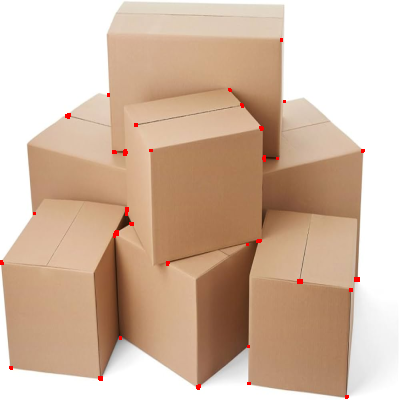

In [ ]:
image=cv.imread('/content/boxes.jpg')
image=cv.resize(image,(400,400),interpolation=cv.INTER_AREA)
harris(image)

### SIFT Keypoint Detection and Description
Create a function that reads an image, converts it to grayscale, and then applies the SIFT algorithm to detect keypoints and compute descriptors. Ensure the detected keypoints are visualized on the original image.

In [ ]:
def sift(path):
  image=cv.imread(path)
  gray=cv.cvtColor(image, cv.COLOR_BGR2GRAY)
  sift = cv.xfeatures2d.SIFT_create()
  kp, des = sift.detectAndCompute(gray, None)
  kp_image = cv.drawKeypoints(image, kp, None, color=(0, 255, 0), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
  cv2_imshow(kp_image)
  cv.waitKey()

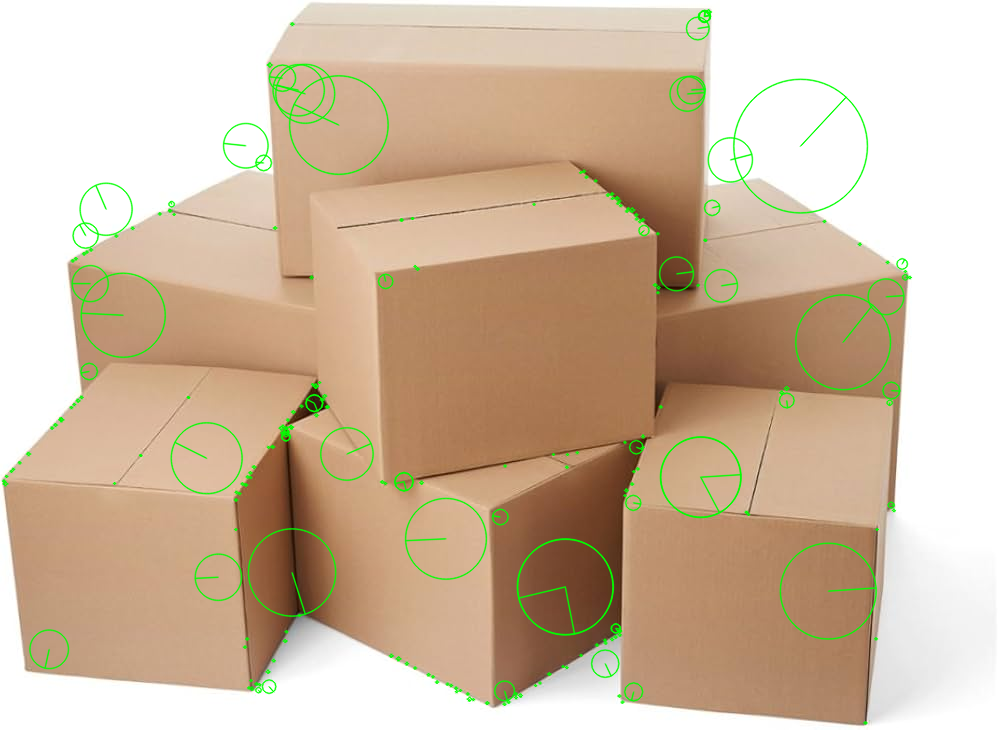

In [ ]:
path='/content/boxes.jpg'
sift(path)

### Feature Matching using ORB
Develop a Python script that matches features between two images using the ORB algorithm. The script should display the matched features between the two images with lines connecting corresponding keypoints.

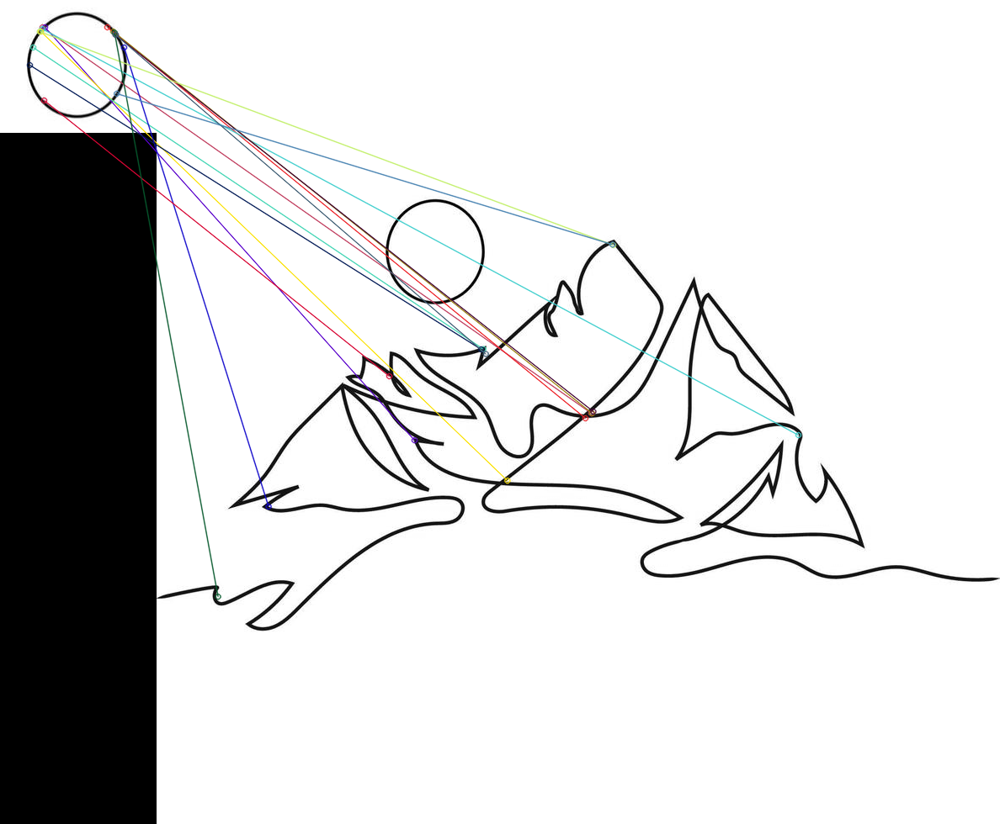

In [ ]:
img1=cv.imread('/content/circle.JPG')
img2=cv.imread('/content/scenery.jpg')
gray1=cv.cvtColor(img1,cv.COLOR_BGR2GRAY)
gray2=cv.cvtColor(img2,cv.COLOR_BGR2GRAY)
orb = cv.ORB_create()
kp1, des1 = orb.detectAndCompute(gray1,None)
kp2, des2 = orb.detectAndCompute(gray2,None)
bf = cv.BFMatcher(cv.NORM_HAMMING, crossCheck=True)
matches = bf.match(des1,des2)

img3 = cv.drawMatches(gray1,kp1,gray2,kp2,matches[:],None,flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
cv2_imshow(img3)
cv.waitKey(0)
cv.destroyAllWindows()


### Implement FAST Corner Detection
Write a Python function to implement the FAST corner detection algorithm. The function should accept an image and return the image with detected keypoints highlighted.

In [ ]:
def fast_function(image):
  gray= cv.cvtColor(image, cv.COLOR_BGR2GRAY)
  fast = cv.FastFeatureDetector_create()
  fast.setNonmaxSuppression(False)

  kp = fast.detect(gray, None)
  kp_image = cv.drawKeypoints(image, kp, None, color=(0, 0, 255))

  return kp_image

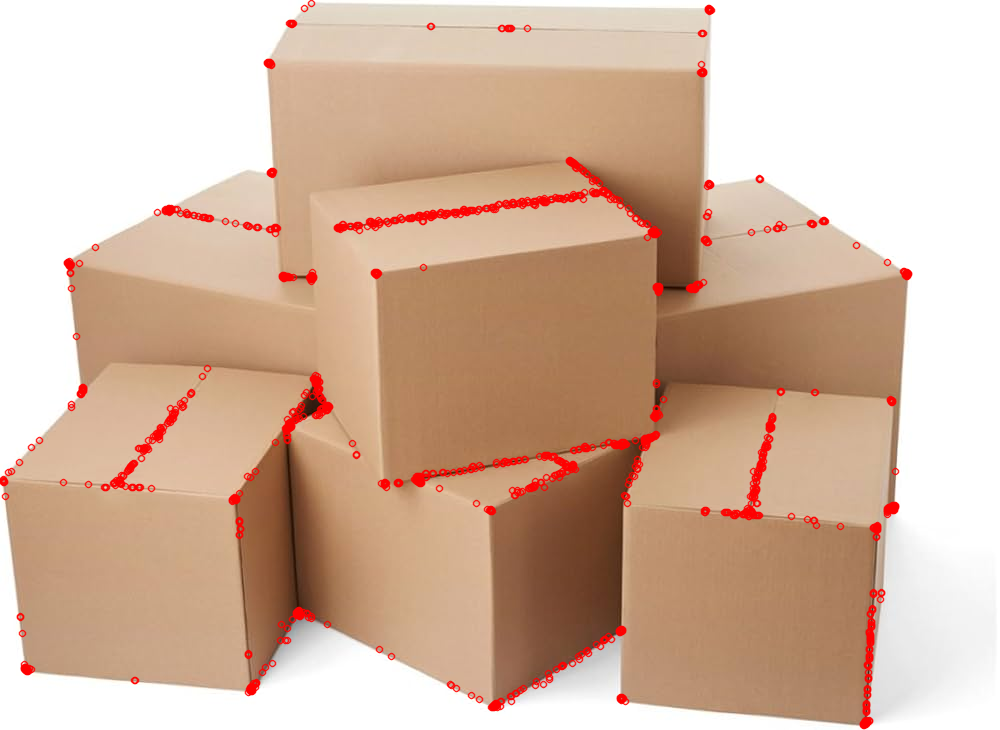

In [ ]:
image=cv.imread('/content/boxes.jpg')
key=fast_function(image)
cv2_imshow(key)
cv.waitKey(0)
cv.destroyAllWindows()

Tough questions

### Custom Canny Edge Detector Implementation
Implement your own version of the Canny edge detection algorithm from scratch using Python (without using OpenCV functions). Your implementation should include:

Gaussian filtering for noise reduction.
Calculation of gradient magnitude and direction.
Non-maximum suppression.
Hysteresis thresholding. Your function should take an image as input and return an image with detected edges.

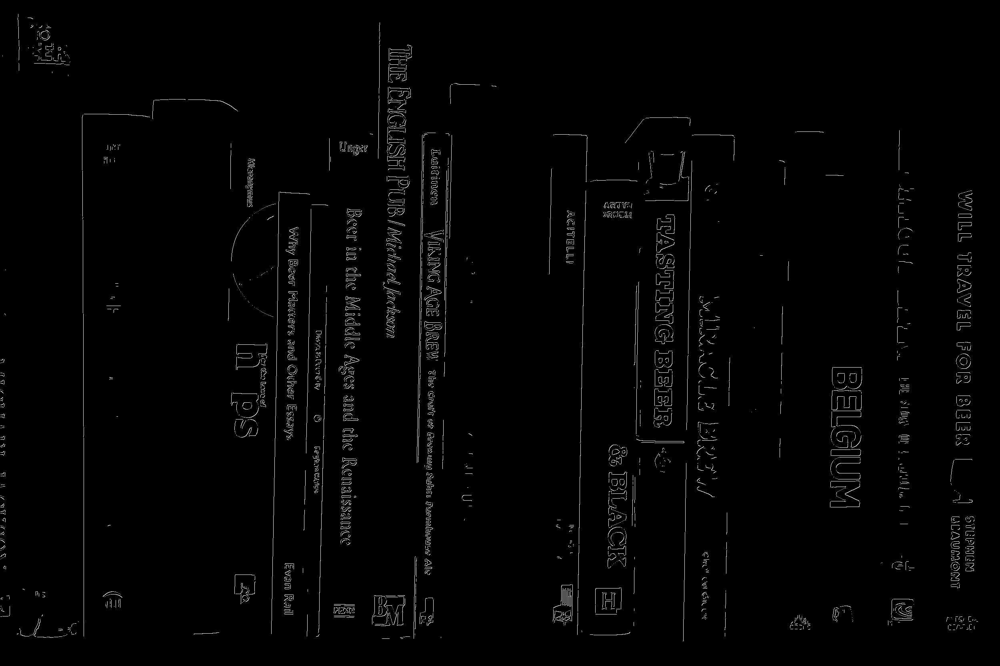

-1

In [ ]:
def custom_canny(image, low_threshold=125, high_threshold=175):
  blur=cv.GaussianBlur(image,(3,3),cv.BORDER_DEFAULT)
  gray = cv.cvtColor(blur, cv.COLOR_BGR2GRAY)
  grad_x = cv.Sobel(gray, cv.CV_64F, 1, 0, ksize=5)
  grad_y = cv.Sobel(gray, cv.CV_64F, 0, 1, ksize=5)
  magnitude = np.sqrt(grad_x**2 + grad_y**2)
  direction = np.arctan2(grad_y, grad_x)
  nms_output = np.zeros_like(magnitude)
  for i in range(1, magnitude.shape[0] - 1):
      for j in range(1, magnitude.shape[1] - 1):
          mag = magnitude[i, j]
          angle = direction[i, j]
          if (0 <= angle < np.pi / 4) or (7 * np.pi / 4 <= angle <= 2 * np.pi):
                neighbors = [magnitude[i, j - 1], magnitude[i, j + 1]]
          elif (np.pi / 4 <= angle < 3 * np.pi / 4):
                neighbors = [magnitude[i - 1, j + 1], magnitude[i + 1, j - 1]]
          elif (3 * np.pi / 4 <= angle < 5 * np.pi / 4):
                neighbors = [magnitude[i - 1, j], magnitude[i + 1, j]]
          else:
                neighbors = [magnitude[i - 1, j - 1], magnitude[i + 1, j + 1]]

          if mag >= max(neighbors):
              nms_output[i, j] = mag
  nms_output = cv.normalize(nms_output, None, 0, 255, cv.NORM_MINMAX, cv.CV_8U)
  nms_output = nms_output.astype(np.uint8)

  strong_edges = nms_output > high_threshold
  weak_edges = (nms_output >= low_threshold) & (nms_output <= high_threshold)

  for i in range(1, nms_output.shape[0] - 1):
      for j in range(1, nms_output.shape[1] - 1):
          if weak_edges[i, j]:
              if np.any(strong_edges[i - 1:i + 2, j - 1:j + 2]):
                  strong_edges[i, j] = True

  edge_map = strong_edges.astype(np.uint8) * 255
  return edge_map


image=cv.imread('/content/bookset.jpg')
nms=custom_canny(image)
cv2_imshow(nms)
cv.waitKey(0)

### Multi-Scale Feature Detection
Create a function that applies multi-scale feature detection using the Laplacian of Gaussian (LoG) method. This function should take an image and a list of sigma values as input, and return an image or set of images showing detected features at the different scales.

In [ ]:
def multi_scale_log(image, sigma_values):
  image=cv.cvtColor(image,cv.COLOR_BGR2GRAY)
  img=[]
  for sigma in sigma_values:
    blur=cv.GaussianBlur(image,(3,3),sigma)
    log=cv.Laplacian(blur,cv.CV_64F)
    log=cv.normalize(log,None,0,255,cv.NORM_MINMAX,cv.CV_8U)
    img.append(log)
  return img

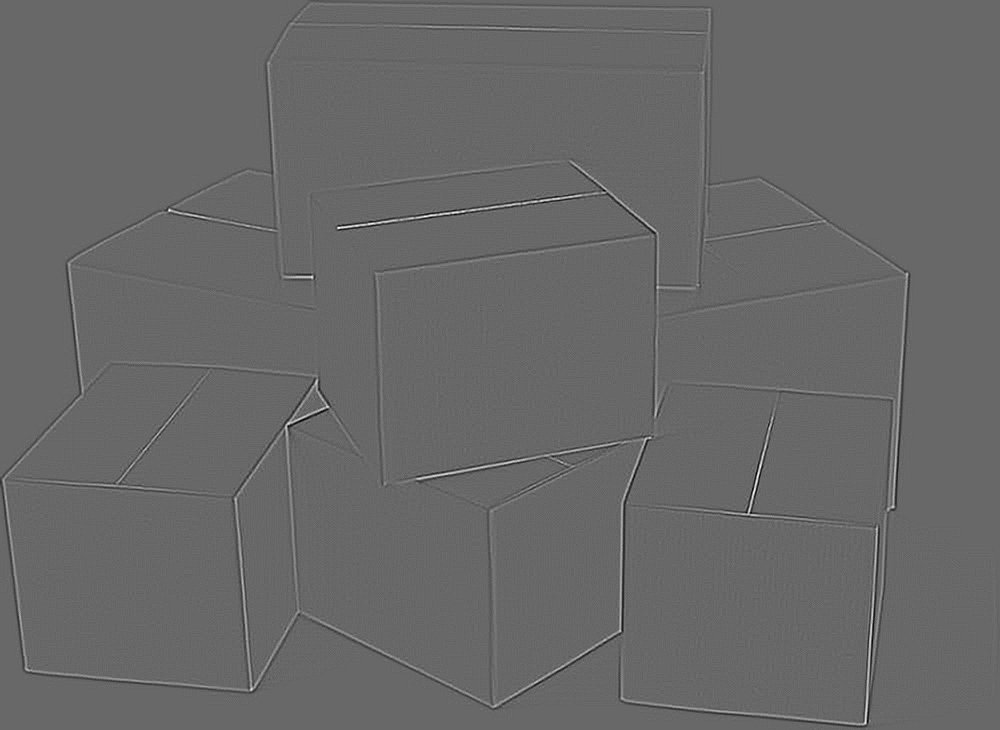

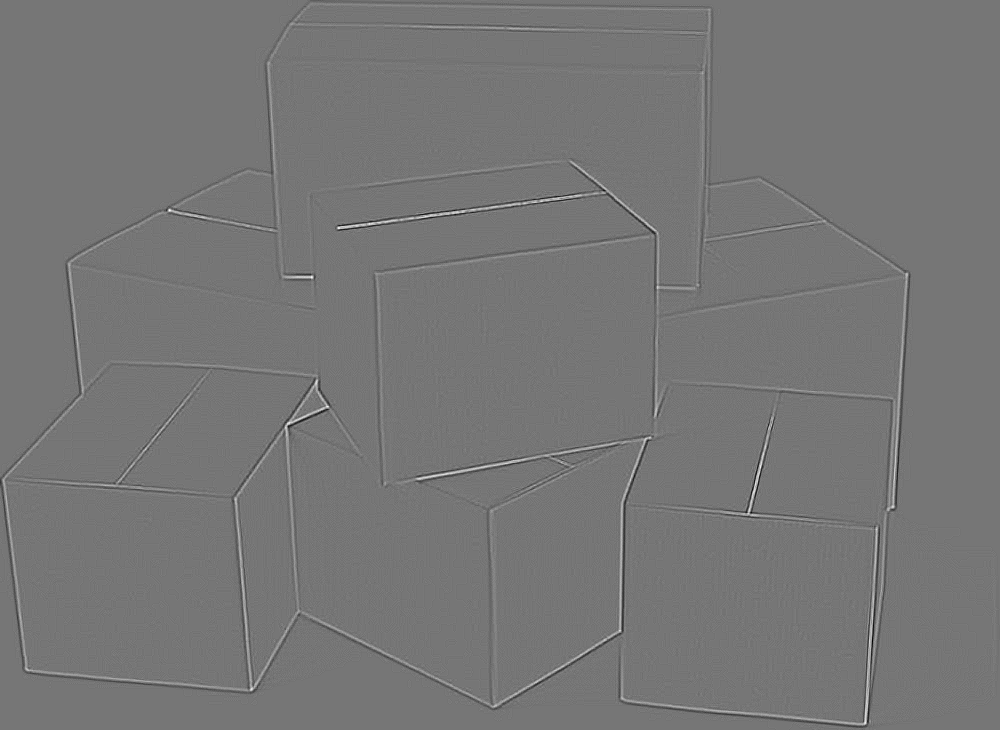

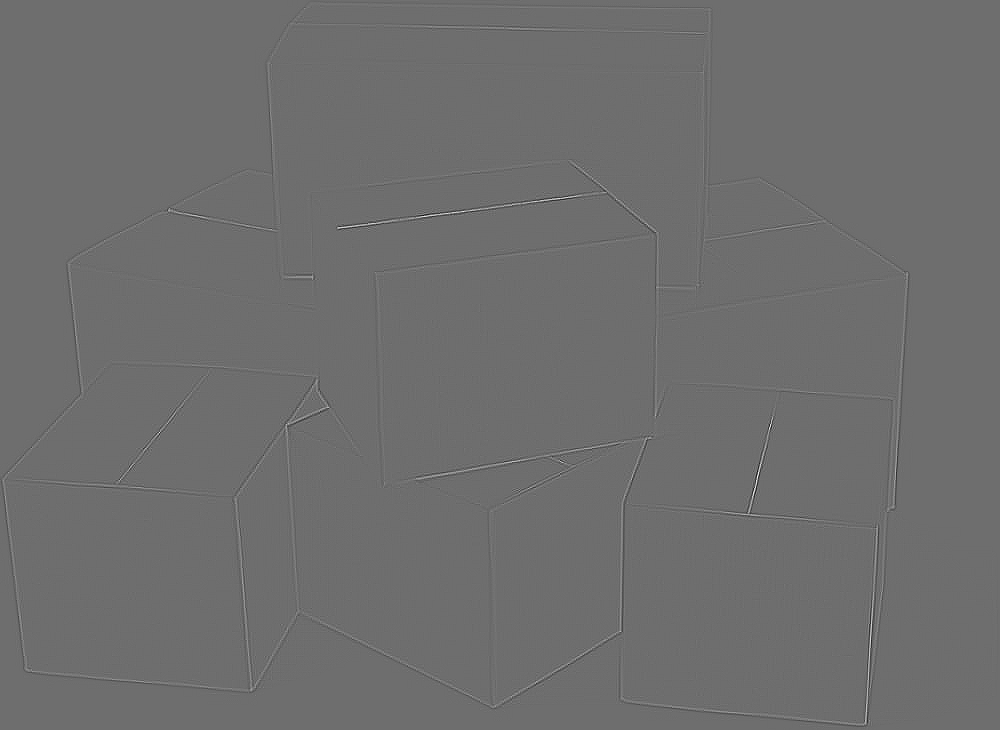

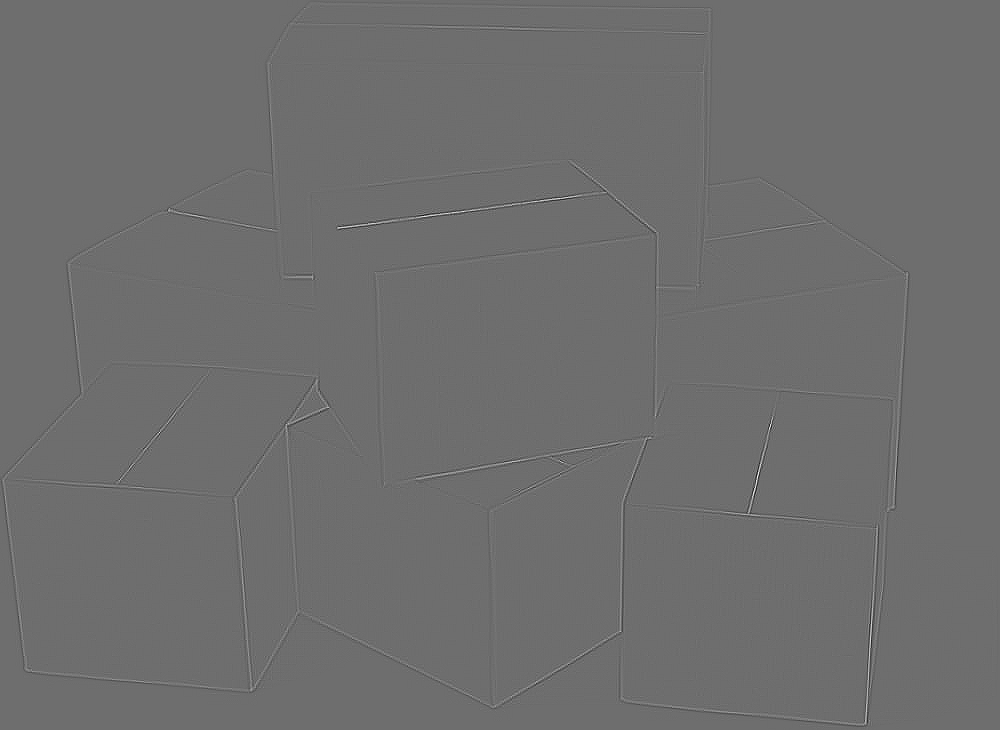

-1

In [ ]:
image=cv.imread('/content/boxes.jpg')
sigma=[1,2,0.1,0.01]
list = multi_scale_log(image,sigma)
for i in list:
  cv2_imshow(i)
cv.waitKey(0)

## Bonus Question

Do your Research on how can we make a 3d model from the Refined frames.  

The refined frames should have themselves available with pictures of their subject at many different angles for 3d modelling to be possible. Thereafter, one can use a conversion software ( that converts 2D to 3D ) such as Autodesk ReCap, Agisoft Metashape, 3DF Zephyr, etc. or perform manual 3D modelling using the reference images by softwares such as Blender, ZBrush, SketchUp, etc. the final steps include refining the 3D model.